In [85]:
# install the input image
!gdown '1FfSpH46ozPWTe1AdTS2NXA_Un8KyZp2z'

Downloading...
From: https://drive.google.com/uc?id=1FfSpH46ozPWTe1AdTS2NXA_Un8KyZp2z
To: /content/cat.jpg
100% 54.3k/54.3k [00:00<00:00, 46.4MB/s]


# Section 1
Read and show the image

In [86]:
# Answer your code here
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

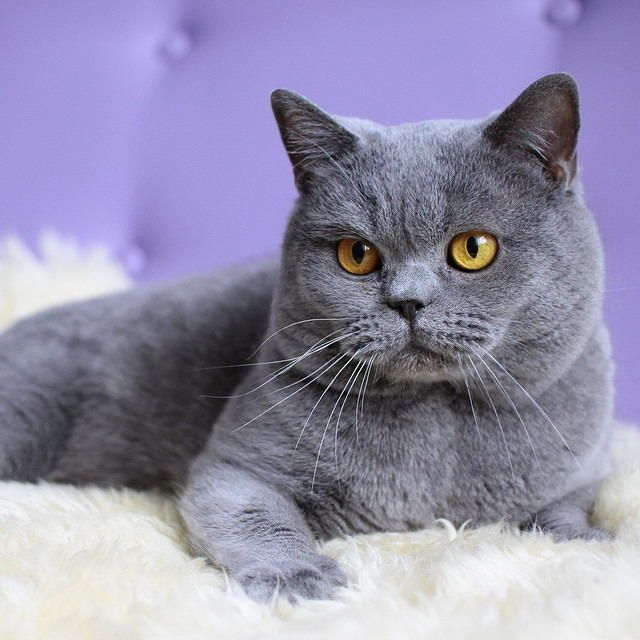

In [87]:
cat_img = cv2.imread("cat.jpg")
cv2_imshow(cat_img)

# Section 2
Apply a 3x3 average filter to an input image whose convolution kernel is:

$$
K = \frac{1}{9}
\begin{bmatrix}
1 & 1 & 1  \\
1 & 1 & 1 \\
1 & 1 & 1  \\
\end{bmatrix}
$$

Filter the input image using the function cv.filter2D() and display the results.

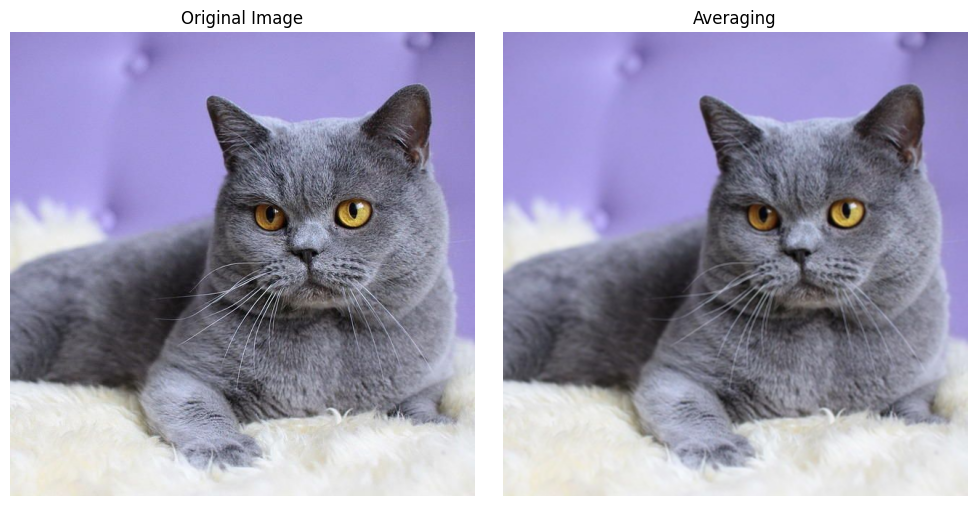

In [88]:
# Answer your code here
kernel_blur = np.full((3,3), 1/9)
cat_img_blur = cv2.filter2D(cat_img, -1, kernel_blur)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cat_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(cat_img_blur, cv2.COLOR_BGR2RGB))
plt.title('Averaging')
plt.axis('off')

plt.tight_layout()
plt.show()

# Section 3
- Add Gaussian noise to an image using the provided function add_gaussian_noise().

- Use cv.GaussianBlur() to denoise and adjust the size of the blur kernel (e.g. : (3, 3), (11, 11) etc.) and sigma (e.g., 1, 2, 5 etc). Then observe and explain its influence on the denoising effect.

**P.S. for the adjusting kernel and sigma, you can try any combination you like, for example: 3x3 kernel with sigma 1 and 11x11 with sigma 1 or 9x9 with sigma 1 and 9x9 with sigma 3**

- Display and compare the following three images (two pairs):

  1. Original image

  2. Image after adding Gaussian noise

  3. Image after applying Gaussian blur

  



In [159]:
# # Adding gaussian noise
def add_gaussian_noise(image, mean=0, sigma=100):
    noise = np.random.normal(mean, sigma, image.shape) # generate noise
    noisy_image = image + noise #  add noise to the image
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image.astype(np.uint8)

noisy_img = add_gaussian_noise(cat_img)

plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
plt.title("Image with Noise")
plt.show()

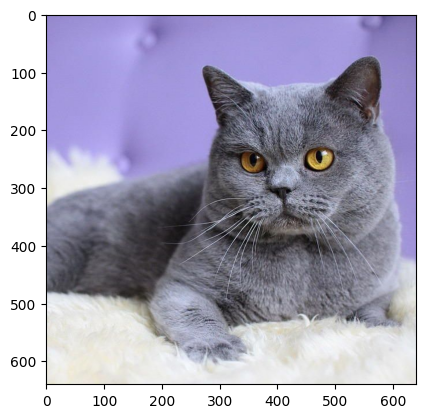

In [90]:
# Answer your code here
plt.imshow(cv2.cvtColor(cat_img, cv2.COLOR_BGR2RGB))
plt.show()

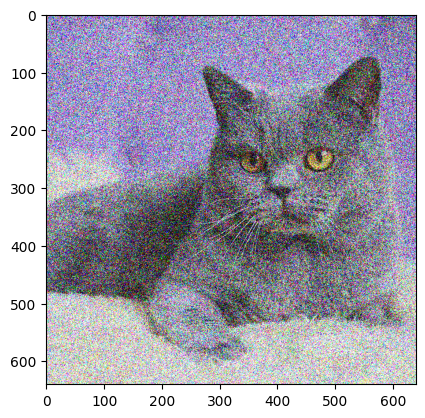

In [91]:
# Answer your code here
plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
plt.show()

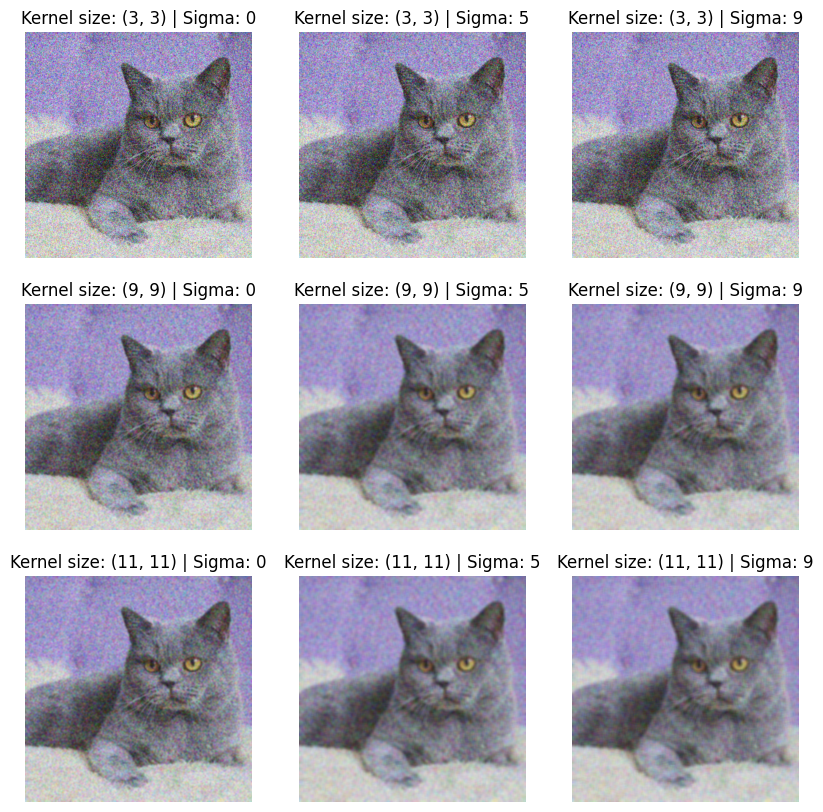

In [92]:
# Answer your code here
kernel_size_lst = [(3,3), (9,9), (11,11)]
sigma_lst = [0,5,9]

fig_num_sqrt = (len(kernel_size_lst)*len(sigma_lst))**0.5
fig_num_sqrt = int(fig_num_sqrt)

plt.figure(figsize=(10, 10))
i=1
for k_size in (kernel_size_lst):
    for sigma in (sigma_lst):
        plt.subplot(fig_num_sqrt, fig_num_sqrt, i)
        gauss_blur_img = cv2.GaussianBlur(noisy_img, k_size, sigma)
        rgb_img = cv2.cvtColor(gauss_blur_img, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb_img)
        plt.title(f'Kernel size: {k_size} | Sigma: {sigma}')
        plt.axis('off')
        i+=1
plt.show()

In [ ]:
#Explanation: Adapting gaussian blur to noise image makes its noise blend to the image and blur(loss sharpness)

# Section 4
- Add salt and pepper noise to an image using the provided add_salt_and_pepper_noise() function.
- Adjust the ratio parameters of salt_prob and pepper_prob to observe the effect of noise on the image. (2 different ratio parameters)
- Apply Medianblur (cv2.medianBlur) to the image after adding noise, and adjust the blur kernel size to try to denoise. (2 different kernel size)
- Show and compare the results.

**P.S. for the comparison of different adjustment, you can try any combination you like, the one you think you will get good result. For example: 0.5 ratio of noises with 3x3 kernel and 0.05 ratio of noises with 11x11 kernel or salt noises 0.2 pepper noises 0.3 with kernel 3x3 and salt noises 0.2 pepper noises 0.3 with kernel 11x11**

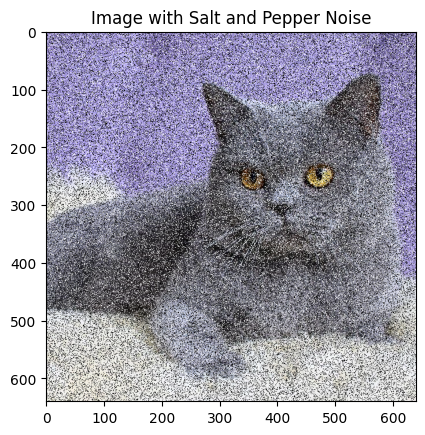

In [93]:
def add_salt_and_pepper_noise(image, salt_prob=0.02, pepper_prob=0.02):
    noisy_image = image.copy()
    # get image size
    total_pixels = image.size // image.shape[2]
    # calculate the number of noises
    num_salt = int(total_pixels * salt_prob)
    num_pepper = int(total_pixels * pepper_prob)

    # Add salt noises
    for _ in range(num_salt):
        x, y = np.random.randint(0, image.shape[1]), np.random.randint(0, image.shape[0]) # # Generate random coordinates (x, y)
        noisy_image[y, x] = [255, 255, 255] # white

    # Add pepper noises
    for _ in range(num_pepper):
        x, y = np.random.randint(0, image.shape[1]), np.random.randint(0, image.shape[0])
        noisy_image[y, x] = [0, 0, 0]  # black

    return noisy_image

# Add salt-and-pepper noises to the image
salt_and_pepper_noisy_img = add_salt_and_pepper_noise(cat_img, salt_prob=0.2, pepper_prob=0.2)

plt.imshow(cv2.cvtColor(salt_and_pepper_noisy_img, cv2.COLOR_BGR2RGB))
plt.title("Image with Salt and Pepper Noise")
plt.show()

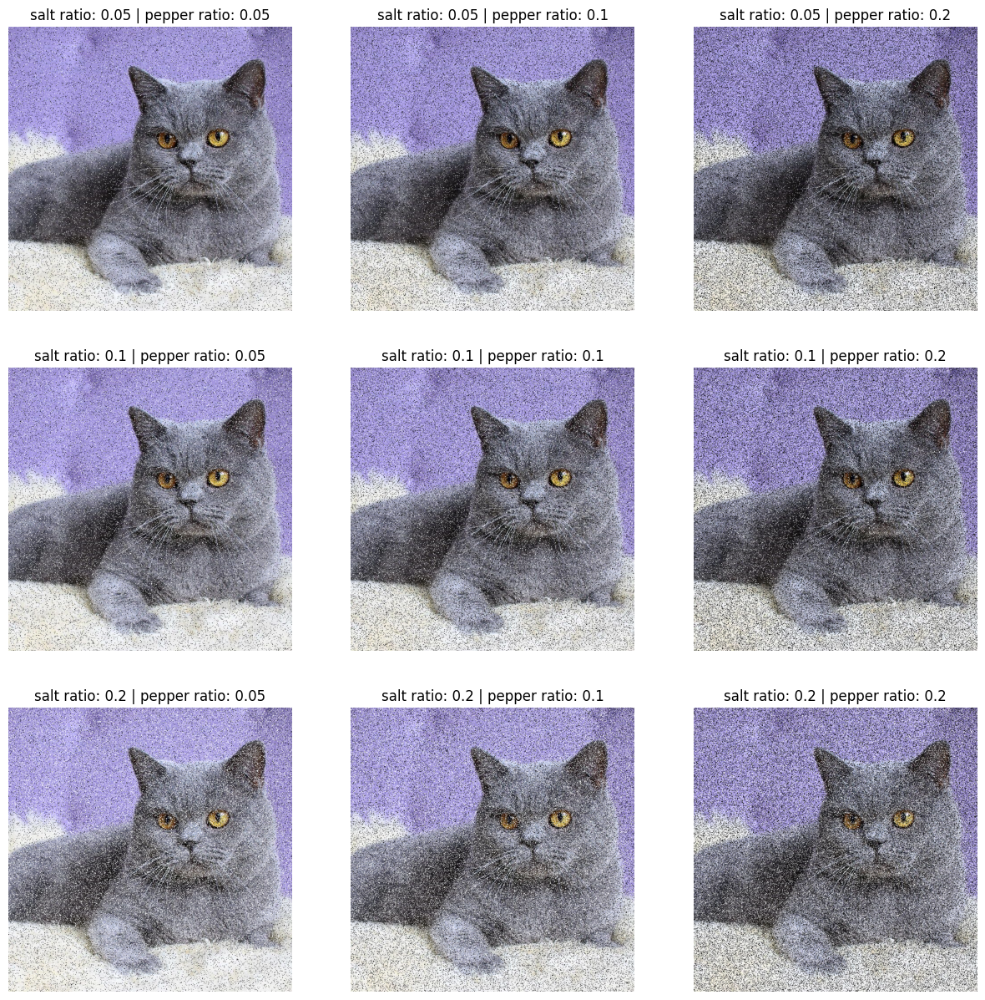

In [94]:
# Answer your code here
salt_ratio = [0.05, 0.1, 0.2]
pepper_ratio = [0.05, 0.1, 0.2]

fig_num_sqrt = (len(salt_ratio)*len(pepper_ratio))**0.5
fig_num_sqrt = int(fig_num_sqrt)

plt.figure(figsize=(15, 15))
i=1

for s_ratio in (salt_ratio):
    for p_ratio in (pepper_ratio):
        plt.subplot(fig_num_sqrt, fig_num_sqrt, i)
        noise_img = add_salt_and_pepper_noise(cat_img, s_ratio, p_ratio)
        rgb_img = cv2.cvtColor(noise_img, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb_img)
        plt.title(f'salt ratio: {s_ratio} | pepper ratio: {p_ratio}')
        plt.axis('off')
        i+=1
plt.show()

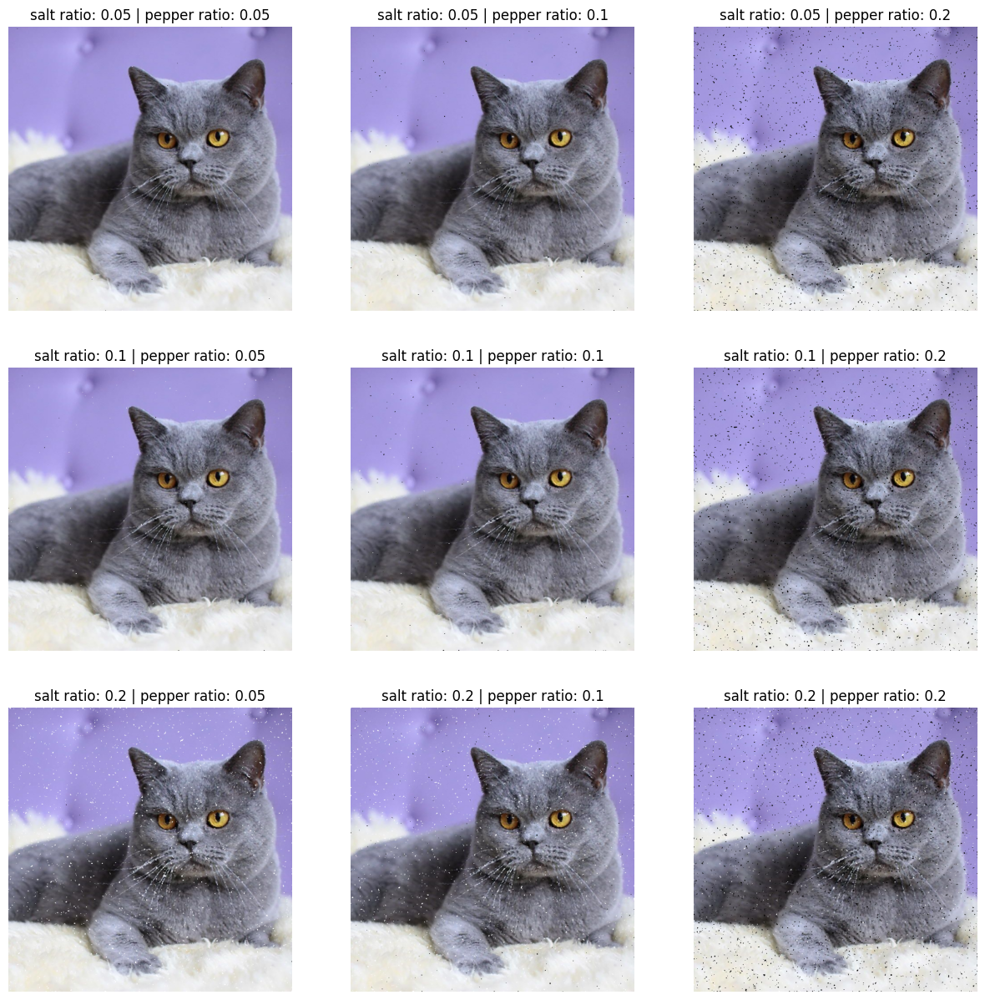

In [95]:
# Answer your code here
Kernel_size = 3
salt_ratio = [0.05, 0.1, 0.2]
pepper_ratio = [0.05, 0.1, 0.2]

fig_num_sqrt = (len(salt_ratio)*len(pepper_ratio))**0.5
fig_num_sqrt = int(fig_num_sqrt)

plt.figure(figsize=(15, 15))
i=1

for s_ratio in (salt_ratio):
    for p_ratio in (pepper_ratio):
        plt.subplot(fig_num_sqrt, fig_num_sqrt, i)
        noise_img = add_salt_and_pepper_noise(cat_img, s_ratio, p_ratio)
        denoise_img = cv2.medianBlur(noise_img, Kernel_size)
        rgb_img = cv2.cvtColor(denoise_img, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb_img)
        plt.title(f'salt ratio: {s_ratio} | pepper ratio: {p_ratio}')
        plt.axis('off')
        i+=1
plt.show()

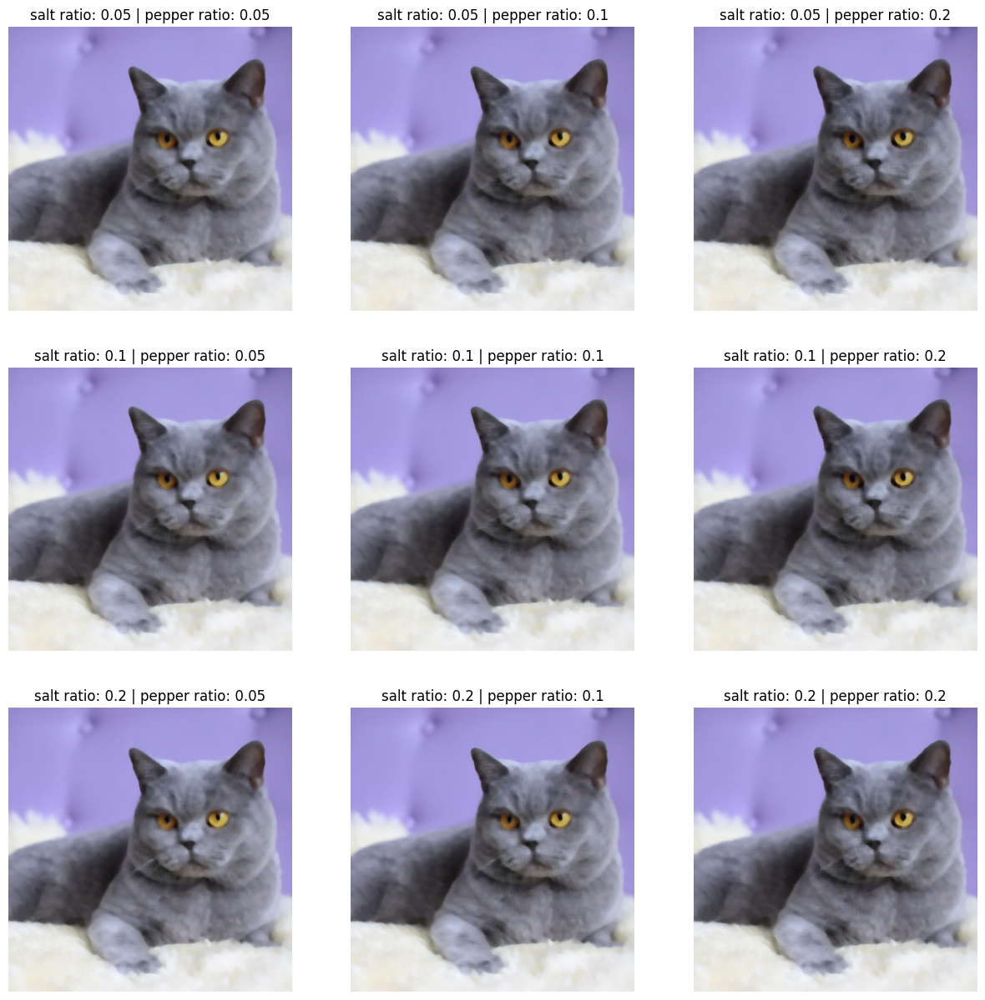

In [96]:
# Answer your code here
Kernel_size = 11
salt_ratio = [0.05, 0.1, 0.2]
pepper_ratio = [0.05, 0.1, 0.2]

fig_num_sqrt = (len(salt_ratio)*len(pepper_ratio))**0.5
fig_num_sqrt = int(fig_num_sqrt)

plt.figure(figsize=(15, 15))
i=1

for s_ratio in (salt_ratio):
    for p_ratio in (pepper_ratio):
        plt.subplot(fig_num_sqrt, fig_num_sqrt, i)
        noise_img = add_salt_and_pepper_noise(cat_img, s_ratio, p_ratio)
        denoise_img = cv2.medianBlur(noise_img, Kernel_size)
        rgb_img = cv2.cvtColor(denoise_img, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb_img)
        plt.title(f'salt ratio: {s_ratio} | pepper ratio: {p_ratio}')
        plt.axis('off')
        i+=1
plt.show()

# Section 5
Fourier Transform

Use the given image "Lenna" to :
1. Perform the Fourier Transform of the input image and display its magnitude spectrum.

2. Implement the Low-Pass Filter (LPF) using NumPy and the High-Pass Filter (HPF) using OpenCV. Apply both filters to the same input image and compare the output results.

3. Compare how LPF and HPF affect the image. Explain how they influence image sharpness, edges, details, and smoothness.

4. Modify the mask size to 10, 30, 100.
Observe and explain the resulting 2 types of filtered images (LPF and HPF) for different mask sizes.

*For explanation part you can answer in both Thai & English language.*

In [97]:
!gdown '1FNXTuv3OcIg-6o8D9XlhVHhMHGiuAQLA'

Downloading...
From: https://drive.google.com/uc?id=1FNXTuv3OcIg-6o8D9XlhVHhMHGiuAQLA
To: /content/Lenna.png
100% 194k/194k [00:00<00:00, 97.4MB/s]


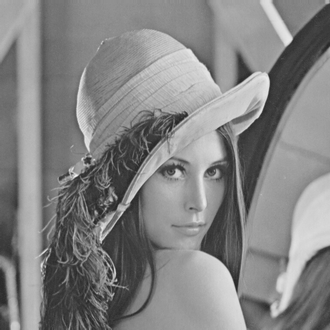

In [98]:
lenna_img = cv2.imread("/content/Lenna.png", cv2.IMREAD_GRAYSCALE)
cv2_imshow(lenna_img)

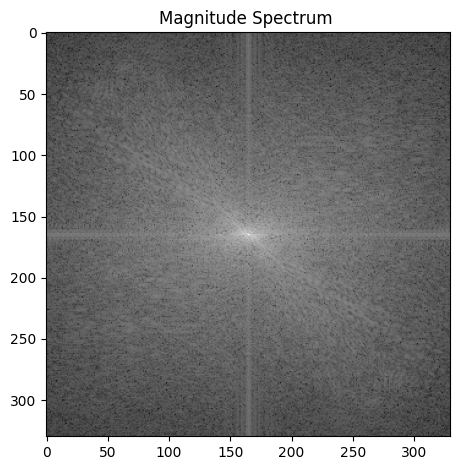

In [99]:
# Answer your code here
dft = cv2.dft(np.float32(lenna_img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
cv_magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

plt.title("Magnitude Spectrum ")
plt.imshow(cv_magnitude_spectrum, cmap='gray')

plt.tight_layout()
plt.show()

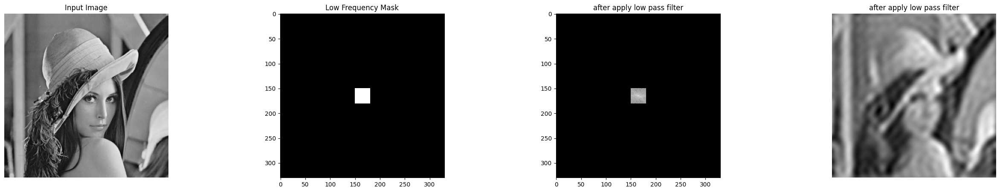

In [147]:
f = np.fft.fft2(lenna_img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))
mask = np.zeros_like(magnitude_spectrum, np.uint8)


crow, ccol = [i//2 for i in magnitude_spectrum.shape]

size = 15

mask[crow-size:crow+size+1, ccol-size:ccol+size+1] = 1

fshift_lowpass = fshift * mask
f_ishift = np.fft.ifftshift(fshift_lowpass)

lowpass_img_back = np.fft.ifft2(f_ishift)
lowpass_img_back = np.real(lowpass_img_back)


plt.figure(figsize=(32, 5))
plt.subplot(1, 4, 1)
plt.title("Input Image")
plt.imshow(lenna_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mask, cmap='gray')  # Display the mask
plt.title('Low Frequency Mask')
plt.axis('on')

plt.subplot(1, 4, 3)
plt.imshow(magnitude_spectrum*mask, cmap='gray')  # Display the mask
plt.title('after apply low pass filter')
plt.axis('on')

plt.subplot(1, 4, 4)
plt.title("after apply low pass filter")
plt.imshow(lowpass_img_back, cmap='gray')
plt.axis('off')

plt.show()

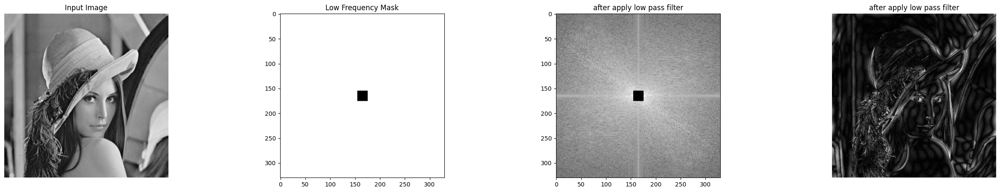

In [158]:
dft = cv2.dft(np.float32(lenna_img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

cv_magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))
mask = np.ones_like(dft_shift, np.uint8)

crow, ccol = [i//2 for i in cv_magnitude_spectrum.shape]

size = 10

mask[crow-size:crow+size+1, ccol-size:ccol+size+1] = 0

dft_shift_highpass = dft_shift * mask
f_ishift = np.fft.ifftshift(dft_shift_highpass)

highpass_img_back = cv2.idft(f_ishift)
highpass_img_back = cv2.magnitude(highpass_img_back[:, :, 0], highpass_img_back[:, :, 1])


plt.figure(figsize=(32, 5))
plt.subplot(1, 4, 1)
plt.title("Input Image")
plt.imshow(lenna_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mask[:, :, 0], cmap='gray')  # Display the mask
plt.title('Low Frequency Mask')
plt.axis('on')

plt.subplot(1, 4, 3)
plt.imshow(cv_magnitude_spectrum*mask[:, :, 0], cmap='gray')  # Display the mask
plt.title('after apply low pass filter')
plt.axis('on')

plt.subplot(1, 4, 4)
plt.title("after apply low pass filter")
plt.imshow(highpass_img_back, cmap='gray')
plt.axis('off')

plt.show()

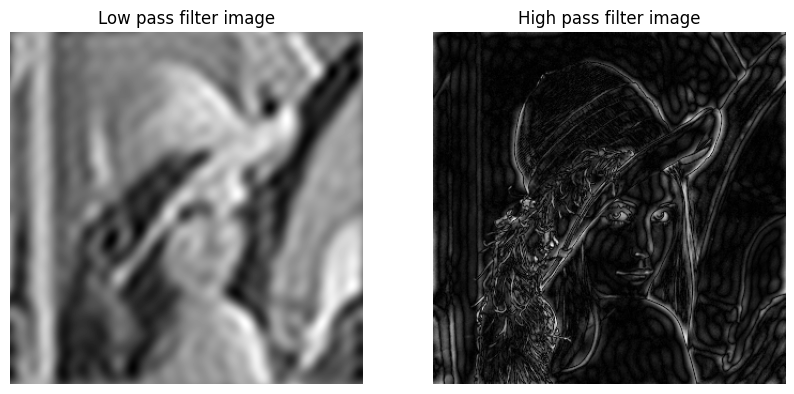

In [119]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(lowpass_img_back, cmap='gray')
plt.title("Low pass filter image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(highpass_img_back, cmap='gray')  # Display the mask
plt.title('High pass filter image')
plt.axis('off')
plt.show()

In [ ]:
#Explaination: LPF makes image smooth and blur(loss sharpness). Unlike HPF that show most edge detail

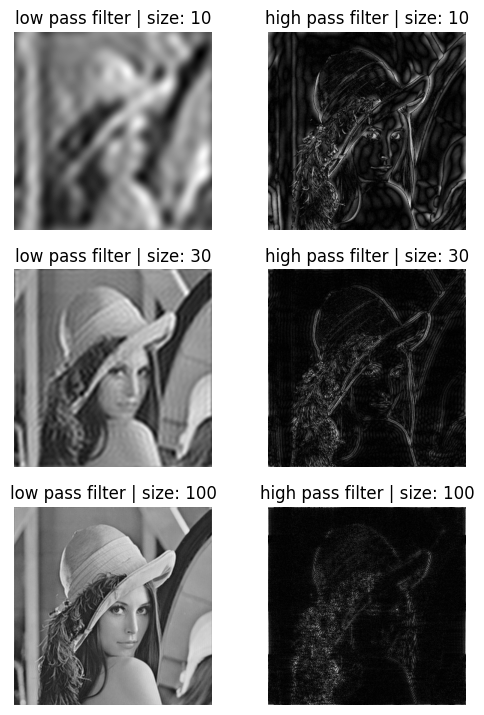

In [155]:
dft = cv2.dft(np.float32(lenna_img), flags=cv2.DFT_COMPLEX_OUTPUT)
fshift = np.fft.fftshift(dft)
crow, ccol = [i//2 for i in fshift[:,:,0].shape]
plt.figure(figsize=(6, 18))
i = 1
for size in [10, 30, 100]:
    for filter, mask, value in zip(['low pass filter', 'high pass filter'], [np.zeros_like(dft, np.uint8), np.ones_like(dft, np.uint8)], [1, 0]):
        fshift_copy = fshift.copy()
        mask[crow-size:crow+size+1, ccol-size:ccol+size+1] = value
        filtered_img = fshift_copy*mask
        f_ishift = np.fft.ifftshift(filtered_img)

        img_back = cv2.idft(f_ishift)
        img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])


        plt.subplot(6, 2, i)
        plt.title(f"{filter} | size: {size}")
        plt.imshow(img_back, cmap='gray')
        plt.axis('off')
        i+=1

plt.show()

In [ ]:
#Explaination: LPF with larger mask area can show more edge detail and like a original image. HPF with larger masking show more a smooth area.